In [1]:
%matplotlib inline

import argparse
import logging
import matplotlib
import copy
import os
import sidekit
import pyaudio
import numpy as np
import scipy
from scipy.io import wavfile
import scipy.fftpack as fft
from scipy.signal import get_window
import IPython.display as ipd
import matplotlib.pyplot as plt
import wave
import soundfile as sf

from matplotlib import pyplot as plot
from s4d.utils import *
from s4d.diar import Diar
from s4d import viterbi, segmentation
from s4d.clustering import hac_bic
from sidekit.sidekit_io import init_logging
from s4d.gui.dendrogram import plot_dendrogram
import IPython.display as ipd



# BIC diarization


# Arguments, variables and logger


In [2]:
#Set the logger
loglevel = logging.INFO
init_logging(level=loglevel)

In [3]:
#Set the input audio or mfcc file and the speech activity detection file (optional).
data_dir = 'wav-files'
show = '12'
# Join various path components 
input_show = os.path.join(data_dir, show + '.wav')
#input_sad = os.path.join(data_dir, 'sad', show + '.sad.seg')
input_sad = None

In [4]:
#Size of left or right windows (step 2)
win_size=250  #windows size in number of frames

In [5]:
#Threshold for: 
# Linear segmentation (step 3) 
# BIC HAC (step 4) 
# Viterbi (step 5)
thr_l = 2 # (LDA)
thr_h = 3 
thr_vit = -250 # (viterbi-algorithm)

In [6]:
save_all = True 

In [7]:
#Prepare various variables
wdir = os.path.join('out', show)

if not os.path.exists(wdir):
    os.makedirs(wdir)

# Display the audio

In [8]:
import librosa
x, sr = librosa.load('wav-files/12.wav')

In [9]:
ipd.Audio('wav-files/12.wav')

In [10]:
sample_rate, audio = wavfile.read('wav-files/12.wav')
print("Sample rate: {0}Hz".format(sample_rate))
print("Audio duration: {0}s".format(len(audio) / sample_rate))

Sample rate: 44100Hz
Audio duration: 51.75582766439909s


In [11]:
def normalize_audio(audio):
    audio = audio / np.max(np.abs(audio))
    return audio

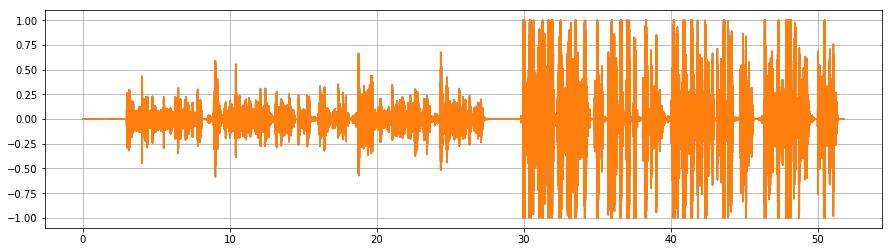

In [12]:
audio = normalize_audio(audio)

plt.figure(figsize=(15,4))
plt.plot(np.linspace(0, len(audio) / sample_rate, num=len(audio)), audio)
plt.grid(True)

# mfcc
Extract and load the MFCC

In [15]:
'''
    FeaturesServer should be used to extract acoustic features (MFCC or LFCC)
    from audio files in SPHERE, WAV or RAW PCM format.
    It can also be used to read and write acoustic features from and to disk
    in SPRO4 or HTK format.
'''    
logging.info('Make MFCC')
#The logging module in Python is a ready-to-use and powerful module that is designed to meet the needs 
#of beginners as well as enterprise teams. 
if save_all:
    fe = get_feature_extractor(input_show, type_feature_extractor='basic')
    mfcc_filename = os.path.join(wdir, show + '.mfcc.h5')
    fe.save(show, output_feature_filename=mfcc_filename)
    fs = get_feature_server(mfcc_filename, feature_server_type='basic')
else:
    fs = get_feature_server(input_show, feature_server_type='basic')
    
cep, _ = fs.load(show)

2019-09-11 14:31:32,092 - INFO - Make MFCC
2019-09-11 14:31:32,602 - INFO - process part : 0.000000 142.652000 142.652000
2019-09-11 14:31:32,761 - INFO - no vad
2019-09-11 14:31:32,762 - INFO - !! size of signal cep: 0.000050 len 13 type size 4
2019-09-11 14:31:32,774 - INFO - [ True  True  True ...  True  True  True]
2019-09-11 14:31:32,820 - INFO - out/12/12.mfcc.h5
2019-09-11 14:31:32,826 - INFO - out/12 ## 12 ## .mfcc.h5
2019-09-11 14:31:32,827 - INFO - feature extractor --> None
2019-09-11 14:31:32,828 - INFO - --------------------
2019-09-11 14:31:32,829 - INFO - None
2019-09-11 14:31:32,830 - INFO - --------------------
2019-09-11 14:31:32,832 - INFO - 	 show: empty 

	 input_feature_filename: empty 

	 feature_filename_structure: out/12/12.mfcc.h5 
	  
	  

	 Post processing options: 
		 mask: None  
		 feat_norm: None 
		 dct_pca: False, dct_pca_config: (12, 12, None) 
		 sdc: False, sdc_config: (1, 3, 7) 
		 delta: False, double_delta: False, delta_filter: [ 0.25  0.5   0.25

In [16]:
cep.shape

(14263, 14)

# Step 2: Initialization
The initial diarization is loaded from a speech activity detection
diarization (SAD) or a segment is created from the first to the last
MFCC feature.

In [17]:
logging.info('Check initial segmentation')
"""
    Return an initial segmentation composed of one segment from the first to the
    last feature in *cep*.

    :param cep: numpy.ndarry containing MFCC
    :param show: the speaker of the cep
    :param cluster: str
    :return: a Diar object
    """
if input_sad is not None:
    init_diar = Diar.read_seg(input_sad)
    init_diar.pack(50)
else:
    init_diar = segmentation.init_seg(cep, show)

if save_all:
    init_filename = os.path.join(wdir, show + '.i.seg')
    Diar.write_seg(init_filename, init_diar)

2019-09-11 14:31:34,667 - INFO - Check initial segmentation


In [6]:
#init_diar

# Step 3: Gaussian Divergence segmentation
First segmentation: Segment each segment of init_diar using the
Gaussian Divergence method

Segmentation based on divergence gaussien.

The segmentation detects the instantaneous change points corresponding to segment boundaries. The proposed algorithm is based on the detection of local maxima. It detects the change points through a gaussian divergence , computed using Gaussians with diagonal covariance matrices. The left and right gaussians are estimated over a five-second window sliding along the whole signal (2.5 seconds for each gaussian, given win =250 features). A change point, i.e. a segment boundary, is present in the middle of the window when the gaussian diverence score reaches 
a local maximum.

In [19]:
logging.info('Gaussian Divergence segmentation')

seg_diar = segmentation.segmentation(cep, init_diar, win_size)

if save_all:
    seg_filename = os.path.join(wdir, show + '.s.seg')
    Diar.write_seg(seg_filename, seg_diar)

2019-09-11 14:31:36,737 - INFO - Gaussian Divergence segmentation


In [5]:
#seg_diar

# Step 4: linear BIC segmentation
this segmentation over the signal fuses consecutive segments of the same
speaker from the start to the end of the record. The measure employs the
$\Delta BIC$ based on Bayesian Information Criterion , using full
covariance Gaussians (see class gauss.GaussFull).

A pass of distance-based segmentation detects the instantaneous change points corresponding to segment boundaries. It detects the change points through a generalized likelihood ratio (GLR), computed using Gaussians with full covariance matrices. The Gaussians are estimated over a five-second window sliding along the whole signal. A change point, i.e. a segment boundary, is present in the middle of the window when the GLR reaches a local maximum.

A second pass over the signal fuses consecutive segments of the same speaker from the start to the end of the record. The measure employs ∆BIC, using full covariance Gaussians, as defined in equation 1 below.

In [21]:
logging.info('Linear BIC, alpha: %f', thr_l)

bicl_diar = segmentation.bic_linear(cep, seg_diar, thr_l, sr=False)

if save_all:
    bicl_filename = os.path.join(wdir, show + '.l.seg')
    Diar.write_seg(bicl_filename, bicl_diar)

2019-09-11 14:31:39,181 - INFO - Linear BIC, alpha: 2.000000


In [4]:
#bicl_diar

# Step 5: BIC HAC
Perform a BIC HAC

2019-09-11 14:31:41,284 - INFO - BIC HAC, alpha: 3.000000


Text(0.5, 1.0, 'Dendrogram')

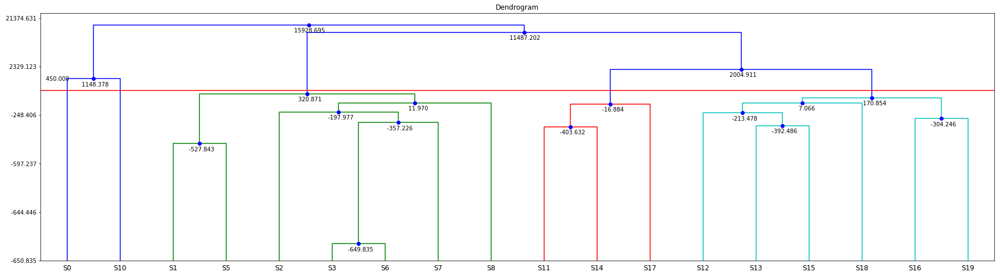

In [23]:
logging.info('BIC HAC, alpha: %f', thr_h)

bic = hac_bic.HAC_BIC(cep, bicl_diar, thr_h, sr=False)
bich_diar = bic.perform(to_the_end=True)

if save_all:
    bichac_filename = os.path.join(wdir, show + '.h.seg')
    Diar.write_seg(bichac_filename, bich_diar)
    
link, data = plot_dendrogram(bic.merge, 450, size=(30,8), log=True)
plt.title('Dendrogram')


In [3]:
#data

In [2]:
#bich_diar

# Step 5: re-segmentation
Viterbi decoding 
HMM is trained: one GMM per speaker, GMM has 8 component with diagonal covariance matrix. Only a penalty between state
is fixed. 
Emission is computed: likelyhood for each feature 
a Viterbi decoding is performed

 Viterbi decoding is performed to generate a new segmentation. A cluster is modeled by a HMM with only one state, represented by a GMM with 8 components (diagonal covariance). The GMM is learned by EM-ML over the segments of the cluster. The log-penalty between two HMMs is fixed experimentally.

The segment boundaries produced by the Viterbi decoding are not perfect: for example, some of them fall within words. In order to avoid this, the boundaries are adjusted by applying a set of rules defined experimentally. They are moved slightly in order to be located in low energy regions. Long segments are also cut recursively at their points of lowest energy in order to yield segments shorter than 20 seconds.

In [26]:
logging.info('Viterbi decoding, penalties: %f', thr_vit)
vit_diar = viterbi.viterbi_decoding(cep, bich_diar, thr_vit)

if save_all:
    vit_filename = os.path.join(wdir, show + '.d.seg')
    Diar.write_seg(vit_filename, vit_diar)

2019-09-11 14:31:45,502 - INFO - Viterbi decoding, penalties: -250.000000


In [1]:
#vit_diar

# Compute the diarization error rate


2019-09-11 14:31:48,874 - ERROR - <class 'ValueError'>
2019-09-11 14:31:48,886 - INFO - append collar


uem from ref


/Users/fatimahaloqayli/anaconda3/lib/python3.7/site-packages/matplotlib/figure.py:2369: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


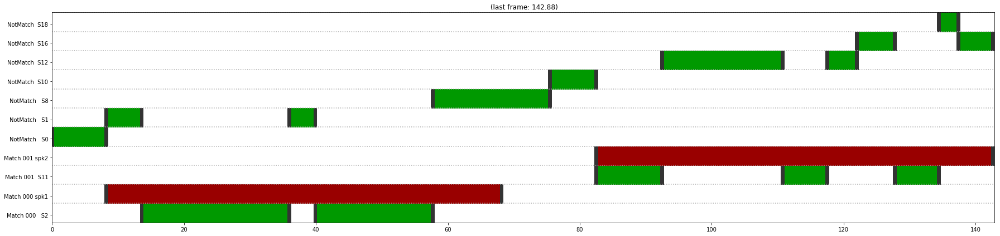

In [28]:

######

from s4d.scoring import DER
from s4d.gui.viewer import PlotDiar
from s4d.gui.viewer_utils import diar_diff

ref = Diar.read_seg(os.path.join(wdir, show + '.seg'))

#uem = Diar.read_uem(os.path.join(wdir, show + '.uem'))

# der = DER(vit_diar, ref, uem, collar=25, no_overlap=False)
# der.confusion()
# der.assignment()
# res = der.error()
# print(res.rate_header())
# print(res.time())
# print(res.rate())

diff_diar = diar_diff(vit_diar, ref)

p = PlotDiar(diff_diar, size=(25, 6))
p.draw()